## Setting up

In [2]:
# libraries
import os
import scanpy as sc
from pathlib import Path
import numpy as np
import rapids_singlecell as rsc

/mnt/data/project0062/.conda/envs/rapids_singlecell/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# setting paths
MAIN_DIR_NAME = "cosmx_gray"
MAIN_DIR = next(p for p in Path.cwd().parents if (p / MAIN_DIR_NAME).exists()) / MAIN_DIR_NAME
os.chdir(MAIN_DIR)

In [4]:
SEED_VALUE = 42
# set NumPy RNG for consistency
np.random.seed(42)

Load the unSCVI object

In [ ]:
CUR_OBJ_V = 'v2'
CUR_OBJ_PATH = MAIN_DIR / 'data' / 'comb' / 'h5ad' / f'comb_{CUR_OBJ_V}.h5ad'
NEW_OBJ_V = 'v3'
NEW_OBJ_PATH = MAIN_DIR / 'data' / 'comb' / 'h5ad' / f'comb_{NEW_OBJ_V}.h5ad'

comb = sc.read_h5ad(CUR_OBJ_PATH)

Quickly check the SCVI UMAP

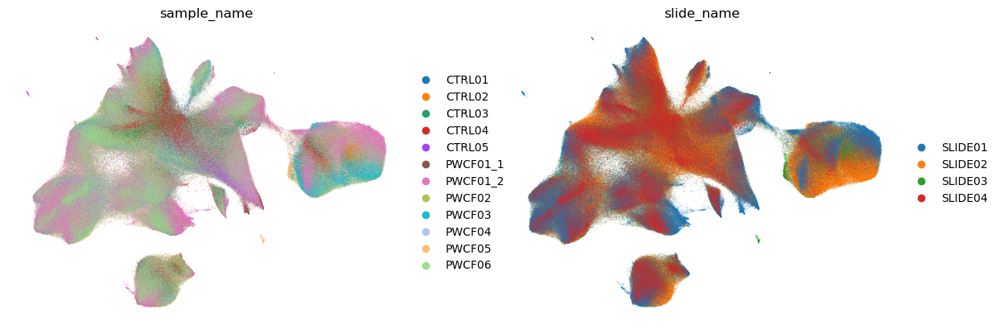

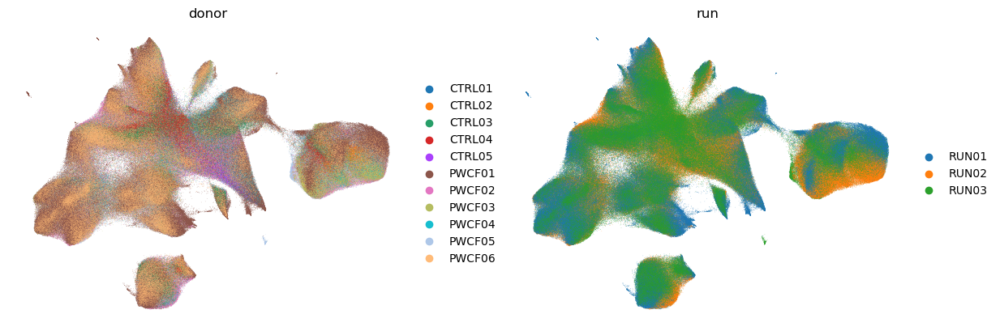

In [5]:
sc.pl.umap(
    comb,
    color=["sample_name", "slide_name"],
    size=0.5,
    frameon=False
)

sc.pl.umap(
    comb,
    color=["donor", "run"],
    size=0.5,
    frameon=False
)

## Leiden clustering

In [81]:
# setting constants
SCVI_CLUSTERS_KEY = "leiden_scVI"
SCVI_NEIGHBORS_KEY = "nb_scVI"
RESOLUTION_VALUE = 1.5
SCVI_UMAP_KEY = 'umap_scVI'

In [82]:
# neighbors were already computed using scVI
rsc.tl.leiden(
    comb, 
    key_added=SCVI_CLUSTERS_KEY, 
    neighbors_key=SCVI_NEIGHBORS_KEY,
    resolution=RESOLUTION_VALUE, 
    n_iterations=100,
    random_state=SEED_VALUE
)

Replace default umap with umap SCVI

In [83]:
# replace X_umap with SCVI UMAP embeddings
comb.obsm['X_umap'] = comb.obsm[SCVI_UMAP_KEY]

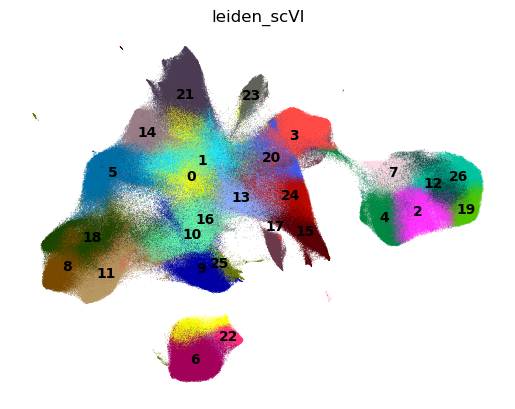

In [84]:
umap_clusters = sc.pl.umap(
    comb,
    color=[SCVI_CLUSTERS_KEY],
    size=0.5,
    frameon=False,
    legend_loc='on data',
    return_fig = True,
    show=False,
)

## CHECK MARKERS

In [88]:
import json
all_markers_path = 'code/canonical_markers/all_markers.json'
with open(all_markers_path, 'r') as f:
    all_markers = json.load(f)
# NOTE: check python file, some genes are suposed to be low/not expressed in some cell types


In [95]:
all_markers

{'basal': ['KRT5', 'KRT14', 'KRT15', 'KRT17', 'IL33'],
 'secretory': ['SCGB1A1', 'SCGB3A1'],
 'ciliated': ['FOXJ1', 'TUBB4B', 'SAA1'],
 'AT1': ['RTKN2', 'COL4A3', 'FSTL3', 'AGER'],
 'AT2': ['NKX2-1', 'ETV5', 'NAPSA', 'LAMP3', 'CD36', 'LPCAT1', 'SFTPD'],
 'T': ['CD3D', 'CD3G', 'CD3E', 'TRBC2', 'CD8A', 'CD8B'],
 'B': ['MS4A1', 'CD19', 'CD74', 'CD79A', 'IGHD', 'IGHM'],
 'B_GERM': ['MZB1', 'IGLL1', 'MKI67'],
 'Plasma': ['IGKC', 'JCHAIN', 'IGHG1/2', 'IGHA1'],
 'APC': ['HLA-DRA', 'HLA-DRB'],
 'neutrophils': ['ITGAM', 'CEACAM8', 'CSF3R', 'ELANE', 'S100A8', 'S100A9'],
 'mast': ['TPSAB1/2', 'KIT', 'GATA2'],
 'DC': ['ITGAM', 'IRF8', 'CD83'],
 'macrophages': ['ITGAM', 'CD74', 'LYZ', 'CD68', 'ITGAX'],
 'monocytes': ['CD14', 'FCGR3A', 'CD86', 'CCR2', 'MRC1', 'APOE'],
 'alveolar_macrophages': ['MARCO', 'MRC1', 'PPARG', 'CD163', 'CD36'],
 'fibroblast': ['PDGFRB', 'LUM', 'COL6A2', 'COL1A1', 'COL1A2'],
 'smooth_muscle': ['ACTA2', 'MYL9', 'RGS5', 'NOX4', 'TAGLN', 'CALD1'],
 'EC': ['PECAM1', 'CD93', 'VWF

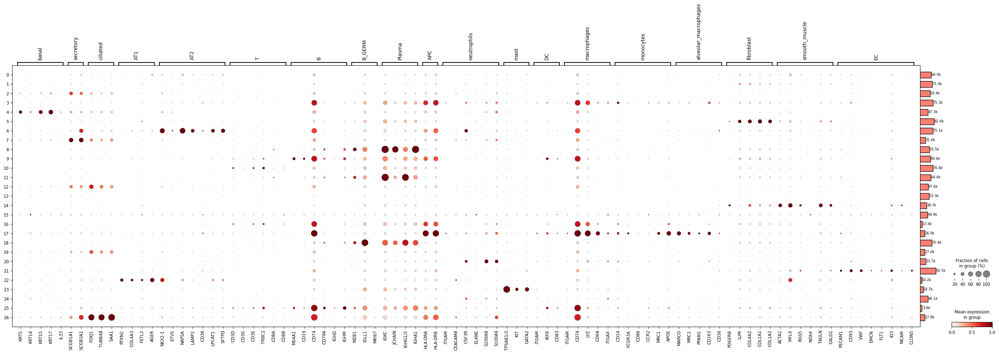

In [92]:
dp = sc.pl.dotplot(
        comb, 
        all_markers, 
        groupby='leiden_scVI', 
        standard_scale='var', 
        return_fig=True
    )
dp.add_totals().show()

## Differential Expression

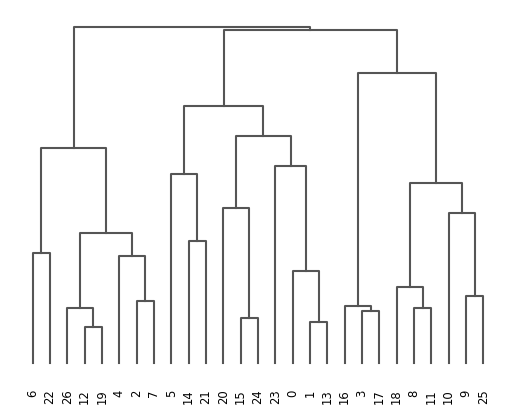

<Axes: >

In [93]:
sc.tl.dendrogram(comb, groupby=SCVI_CLUSTERS_KEY)
sc.pl.dendrogram(comb, groupby=SCVI_CLUSTERS_KEY)

defaulting to using `.raw`


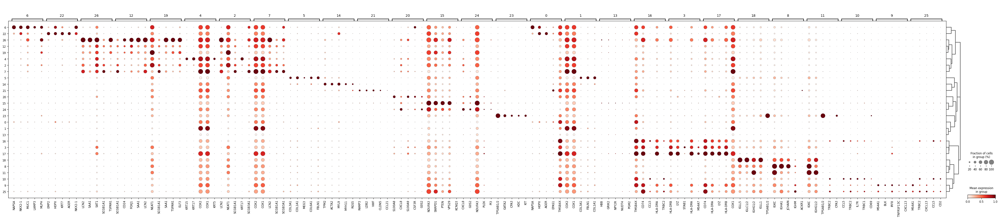

In [94]:
rsc.tl.rank_genes_groups_logreg(comb, groupby=SCVI_CLUSTERS_KEY)
sc.pl.rank_genes_groups_dotplot(
    comb, groupby=SCVI_CLUSTERS_KEY, standard_scale="var", n_genes=5
)

In [ ]:
sc.get.rank_genes_groups_df(comb, group='23').head(20)

### Check spatial location of clusters

In [5]:
NEW_OBJ_V = 'v3'
NEW_OBJ_PATH = MAIN_DIR / 'data' / 'comb' / 'h5ad' / f'comb_{NEW_OBJ_V}.h5ad'

comb = sc.read_h5ad(NEW_OBJ_PATH)

In [103]:
sample_df = comb.obs[comb.obs['sample_name']=='PWCF01_1'].copy()


In [107]:
import pypalettes as pp

# Load the colormap
cmap = pp.load_cmap("alphabet")

# Get N discrete colors as hex
n = 26
palette = [cmap(i / (n-1)) for i in range(n)]

# Convert RGBA -> hex
import matplotlib.colors as mcolors
palette = [mcolors.to_hex(c) for c in palette]

print(palette)


['#f0a0ff', '#0075dc', '#993f00', '#4c005c', '#191919', '#005c31', '#2bce48', '#ffcc99', '#808080', '#94ffb5', '#8f7c00', '#9dcc00', '#c20088', '#003380', '#ffa405', '#ffa8bb', '#426600', '#ff0010', '#5ef1f2', '#00998f', '#e0ff66', '#740aff', '#990000', '#ffff80', '#ffe100', '#ff5005']


/mnt/data/project0062/.conda/envs/rapids_singlecell/lib/python3.13/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_color_manual can return a maximum of 26 values. 27 were requested from it.
/mnt/data/project0062/.conda/envs/rapids_singlecell/lib/python3.13/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_color_manual can return a maximum of 26 values. 27 were requested from it.


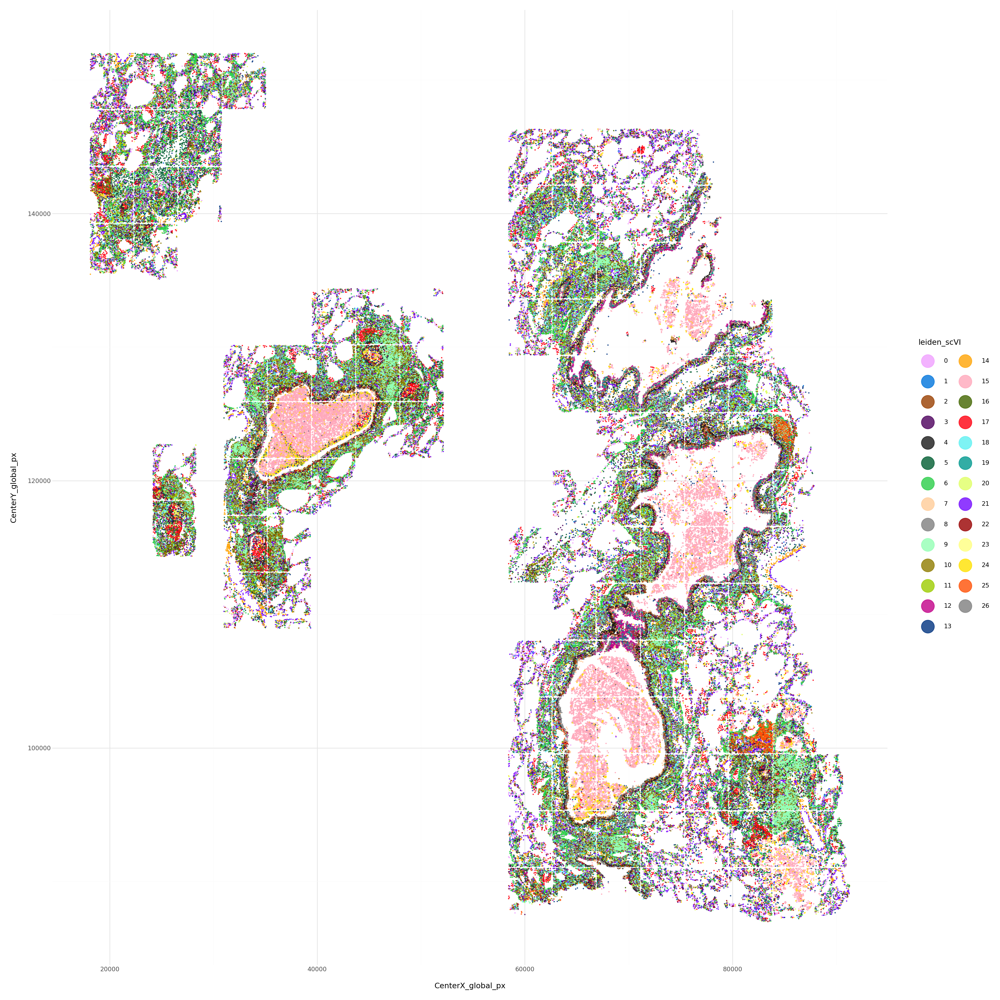

In [108]:
import plotnine as p9

(
    p9.ggplot(sample_df, p9.aes(x='CenterX_global_px', y='CenterY_global_px', color='leiden_scVI'))
    + p9.geom_point(size=0.1, alpha=0.8)
    + p9.scale_color_manual(values=palette)
    + p9.theme_minimal()
    + p9.theme(figure_size=(20, 20))
    + p9.guides(color=p9.guide_legend(override_aes={'size': 10}))  # increase legend dot size
)

cluster 15 appears to be cell debris

['#f0a0ff', '#0075dc', '#993f00', '#4c005c', '#191919', '#005c31', '#2bce48', '#ffcc99', '#808080', '#94ffb5', '#8f7c00', '#9dcc00', '#c20088', '#003380', '#ffa405', '#ffa8bb', '#426600', '#ff0010', '#5ef1f2', '#00998f', '#e0ff66', '#740aff', '#990000', '#ffff80', '#ffe100', '#ff5005']


/mnt/data/project0062/.conda/envs/rapids_singlecell/lib/python3.13/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_color_manual can return a maximum of 26 values. 27 were requested from it.
/mnt/data/project0062/.conda/envs/rapids_singlecell/lib/python3.13/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_color_manual can return a maximum of 26 values. 27 were requested from it.


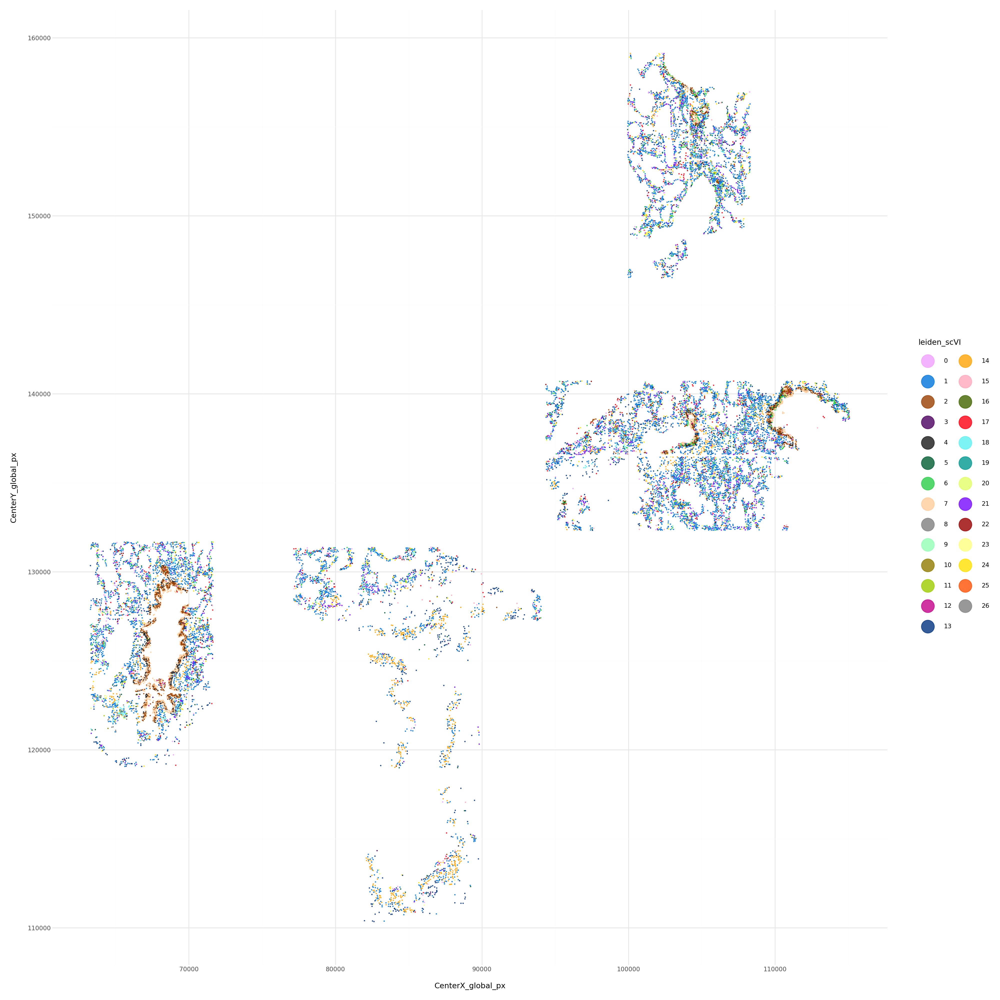

In [12]:
SAMPLE_NAME = 'CTRL04'

sample_df = comb.obs[comb.obs['sample_name']==SAMPLE_NAME].copy()

import pypalettes as pp

# Load the colormap
cmap = pp.load_cmap("alphabet")

# Get N discrete colors as hex
n = 26
palette = [cmap(i / (n-1)) for i in range(n)]

# Convert RGBA -> hex
import matplotlib.colors as mcolors
palette = [mcolors.to_hex(c) for c in palette]

print(palette)

import plotnine as p9

(
    p9.ggplot(sample_df, p9.aes(x='CenterX_global_px', y='CenterY_global_px', color='leiden_scVI'))
    + p9.geom_point(size=0.1, alpha=0.8)
    + p9.scale_color_manual(values=palette)
    + p9.theme_minimal()
    + p9.theme(figure_size=(20, 20))
    + p9.guides(color=p9.guide_legend(override_aes={'size': 10}))  # increase legend dot size
)


In [9]:
sample_df

,fov,Area,AspectRatio,Width,Height,Mean.PanCK,Max.PanCK,Mean.CD68,Max.CD68,Mean.Membrane,...,donor,run,modulator,age,mutation,sex,bmi,_scvi_batch,_scvi_labels,leiden_scVI
cell_id,,,,,,,,,,,,,,,,,,,,,
c_4_1_16,1,9073,0.94,143,134,2769.2,25824,852.1,4348,907.8,...,CTRL03,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,24
c_4_1_18,1,6722,0.79,82,104,2363.6,9632,4440.7,29416,1365.3,...,CTRL03,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,24
c_4_1_20,1,3377,0.85,83,98,2508.0,10916,1076.8,2256,893.2,...,CTRL03,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,1
c_4_1_21,1,5327,0.74,104,77,2080.7,10068,1127.2,9400,1096.2,...,CTRL03,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,13
c_4_1_22,1,21265,0.88,182,161,865.4,3600,29128.0,51212,1484.5,...,CTRL03,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c_4_223_702,223,5639,0.92,92,100,2051.9,10288,1246.7,4432,1584.0,...,CTRL03,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,0
c_4_223_703,223,1977,0.60,68,41,1564.1,3240,1585.8,3700,1352.9,...,CTRL03,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,1
c_4_223_705,223,5860,0.96,113,118,2410.6,6252,1278.8,6344,1142.9,...,CTRL03,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,6


### Save object

In [115]:
# save SCVI object with clusters as h5ad
comb.write_h5ad(NEW_OBJ_PATH)

In [114]:
comb.obs


,fov,Area,AspectRatio,Width,Height,Mean.PanCK,Max.PanCK,Mean.CD68,Max.CD68,Mean.Membrane,...,donor,run,modulator,age,mutation,sex,bmi,_scvi_batch,_scvi_labels,leiden_scVI
cell_id,,,,,,,,,,,,,,,,,,,,,
c_3_1_3,1,11913,0.92,124,135,338.0,2788,644.8,6000,426.0,...,CTRL01,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,24
c_3_1_4,1,10226,0.98,126,123,368.3,2100,610.4,7832,501.4,...,CTRL01,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,20
c_3_1_5,1,5684,0.53,63,120,301.7,728,820.7,3008,425.5,...,CTRL01,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,24
c_3_1_6,1,4008,0.54,53,99,366.9,828,1058.0,7220,529.7,...,CTRL01,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,13
c_3_1_7,1,2753,0.65,79,51,1204.7,4076,784.5,6660,2231.7,...,CTRL01,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c_4_192_1024,192,11110,0.77,140,108,515.6,4264,467.1,6224,1445.7,...,PWCF06,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,5
c_4_192_1025,192,4487,0.56,124,69,13928.8,55152,416.3,4584,4126.3,...,PWCF06,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,6
c_4_192_1026,192,1598,0.51,38,74,483.2,2584,572.6,3796,1074.7,...,PWCF06,RUN03,UNK,UNK,UNK,UNK,UNK,2,0,11
